In [4]:
# Challenge: https://www.kaggle.com/c/yelp-restaurant-photo-classification

from keras.models import Sequential, Graph
from keras.layers.core import Flatten, Dense, Dropout, Activation
from keras.layers.convolutional import Convolution1D, Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.utils.visualize_util import plot, to_graph
from keras.utils import np_utils, generic_utils
from keras.optimizers import SGD
from IPython.display import SVG
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from scipy import misc
import cv2
import IPython

%matplotlib inline
plt.rcParams['figure.figsize'] = (20.0, 20.0) # set default size of plots

** Analysis: **


good_for_lunch - Looks like some combination of all the photos a particular business. If the place is good for lunch, presumably people would know it and more likely visit it during lunch time. So we might see more daytime photos, with probably less artificial light on overall scene as well as on object reflectance.

good_for_dinner - This could have somewhat contrasting effects to places good_for_lunch. 

takes_reservations - Seems harder, even for humans, unless we are lucky enought to find it written somewhere in the images. 

outdoor_seating - More natural lights, probably more greener too (hoping we preserve environment everywhere :)), unique shadows of the trees, and probably people might look more relaxed in outdoor environments. In addition, in outdoor places it's more likely to observe different furniture, table linens, and chairs.  

restaurant_is_expensive - Heavy wallets maybe :P? Some indicators like rich table linens; good looking furniture; more organized food, people and sitting area; 

has_alcohol - Alcohol bottles, glasses on the table; dizzy folks :D; probably more cigarettes, assuming this addiction goes hand in hand. 

has_table_service - Waiters or a manager roaming around or standing nearby a table; more people standing in a scattered manner compared to self service. 

ambience_is_classy - classy furniture, classy architecture, classy lights, classy plates maybe. 

good_for_kids - kids in the picture; more laughing, playing, and jumping; toys?; high chairs; baloons; food over mouth!?; crazy hats? 

## Read input data

In [5]:
%ls ../input

sample_submission.csv       train_photo_to_biz_ids.csv
test_photo_to_biz.csv       train_photos/
train.csv


In [6]:
train_photo_to_biz_ids = pd.read_csv('../input/train_photo_to_biz_ids.csv')

In [7]:
biz_id_to_photos = {k: g["photo_id"].tolist() for k,g in train_photo_to_biz_ids.groupby("business_id")}

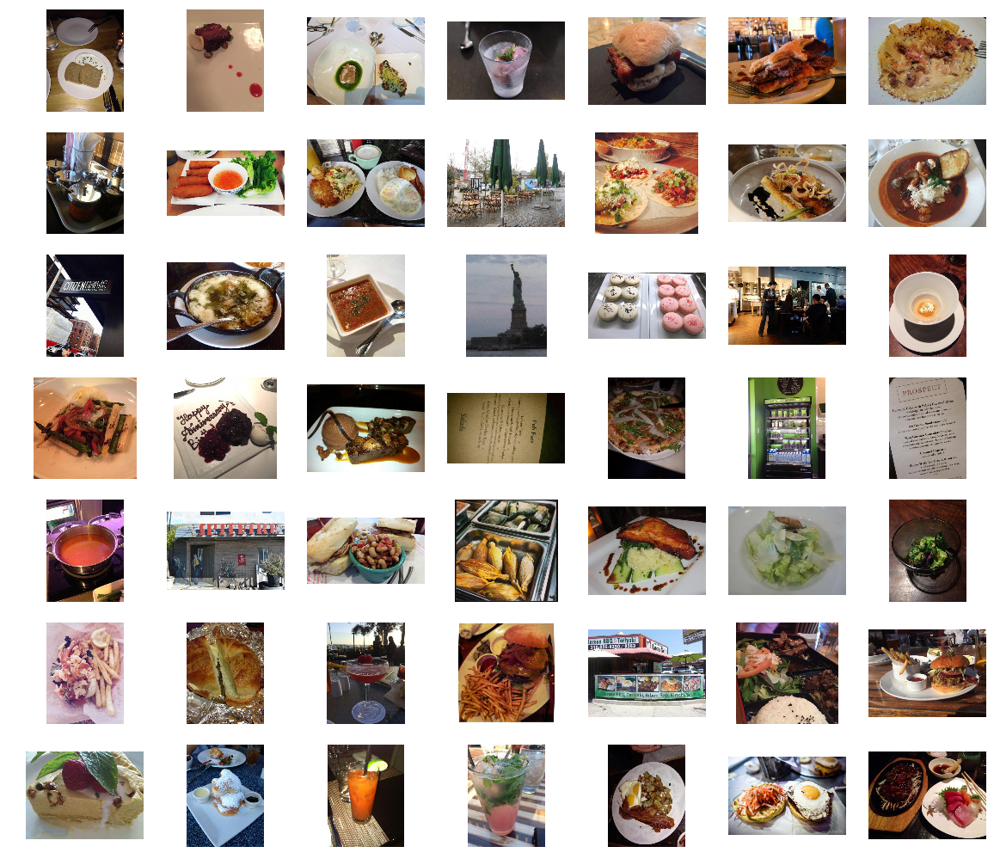

In [6]:
num_samples = 49
for idx, img_id in enumerate(train_photo_to_biz_ids.photo_id[np.random.randint(0, len(train_photo_to_biz_ids), num_samples)]):
    img = misc.imread(os.path.join('../input','train_photos', str(img_id)+".jpg"))
    plt.subplot(np.sqrt(num_samples)+1, np.sqrt(num_samples), idx+1)
    plt.axis('off')
    plt.imshow(img)

In [8]:
restaurant_attributes = {0: "good_for_lunch",
1: "good_for_dinner",
2: "takes_reservations",
3: "outdoor_seating",
4: "restaurant_is_expensive",
5: "has_alcohol",
6: "has_table_service",
7: "ambience_is_classy",
8: "good_for_kids",}

biz_id_to_attribs = pd.read_csv('../input/train.csv')
for attrib_key,attrib in restaurant_attributes.iteritems():
    biz_id_to_attribs[attrib] = biz_id_to_attribs['labels'].str.contains(str(attrib_key))
biz_id_to_attribs = biz_id_to_attribs.dropna()
biz_id_to_attribs = biz_id_to_attribs.drop_duplicates()
biz_id_to_attribs.head()

,business_id,labels,good_for_lunch,good_for_dinner,takes_reservations,outdoor_seating,restaurant_is_expensive,has_alcohol,has_table_service,ambience_is_classy,good_for_kids
0,1000,1 2 3 4 5 6 7,False,True,True,True,True,True,True,True,False
1,1001,0 1 6 8,True,True,False,False,False,False,True,False,True
2,100,1 2 4 5 6 7,False,True,True,False,True,True,True,True,False
3,1006,1 2 4 5 6,False,True,True,False,True,True,True,False,False
4,1010,0 6 8,True,False,False,False,False,False,True,False,True


## Pre-process images

In [11]:
def readImage(img_id, vgg_compatible_input=True, preprocess=False):
    img = misc.imread(os.path.join('../input','train_photos', str(img_id)+".jpg"))
    
    if preprocess:
        img = cv2.resize(img, (448, 448)).astype(np.float32)
        img[:,:,0] -= 103.939
        img[:,:,1] -= 116.779
        img[:,:,2] -= 123.68
        
    if vgg_compatible_input:
        img = img.transpose((2,0,1))
        img = np.expand_dims(img, axis=0)
        
    return img

## Visualize the input data

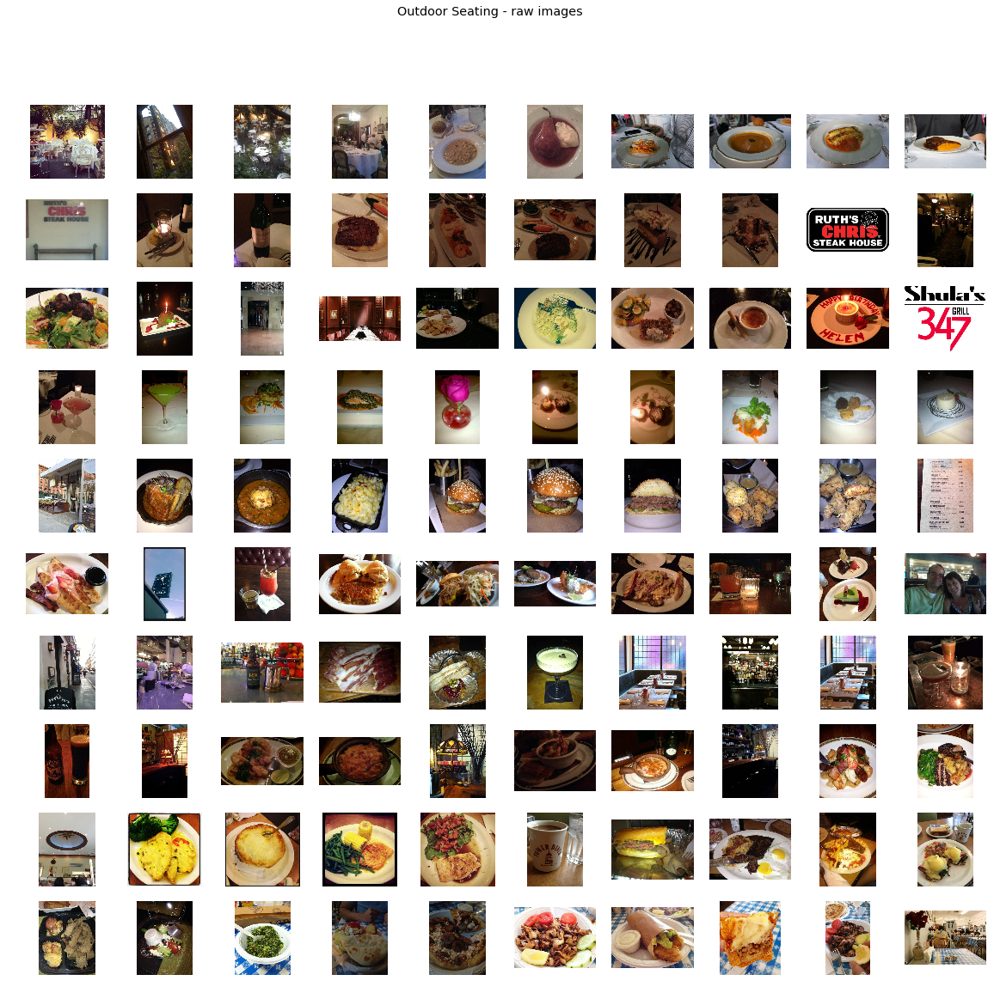

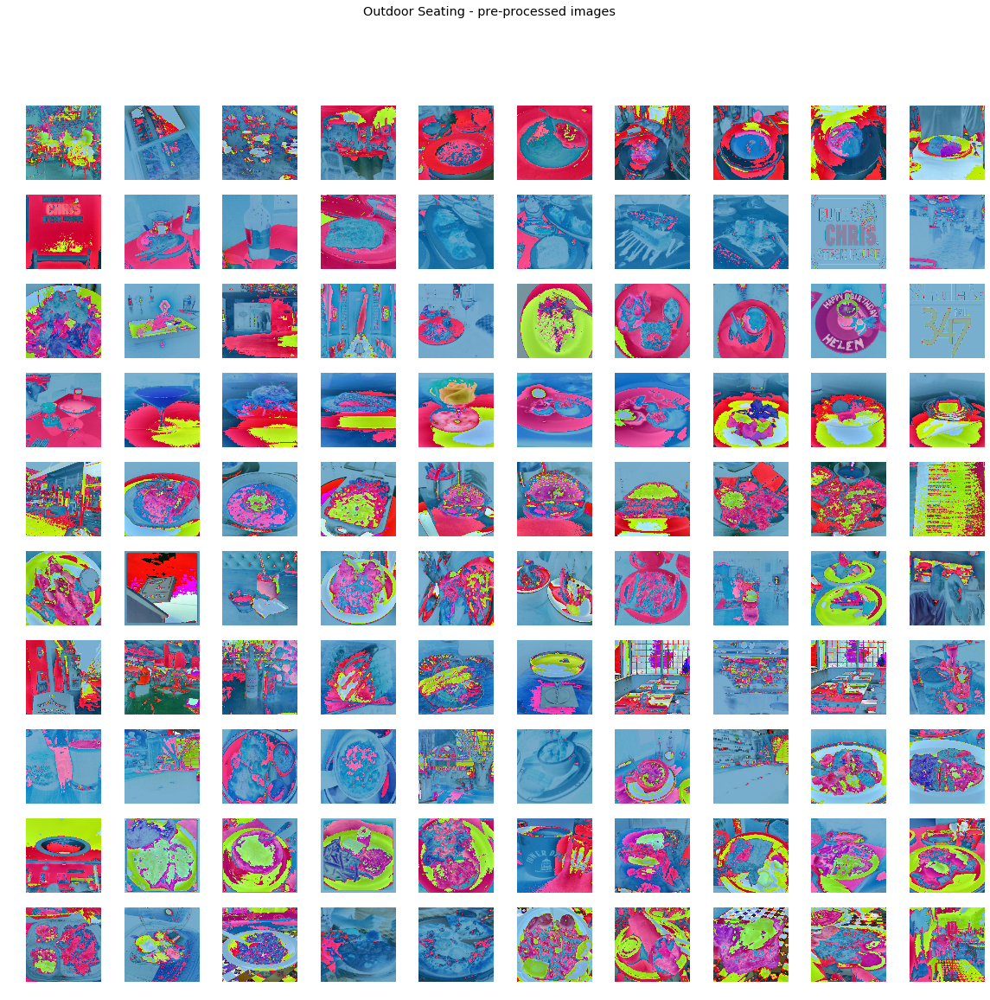

In [70]:
has_alcohol_places = biz_id_to_attribs[biz_id_to_attribs['has_alcohol'] == True]['business_id']
max_biz, max_biz_photos = 10, 10
fig = plt.figure(1)
st = fig.suptitle("Outdoor Seating - raw images", fontsize="x-large")
for i, biz_id in enumerate(has_alcohol_places.to_dict().values()[:max_biz]): # iterate over business with attrib has_alcohol
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)): # iterate over all photos of that particular business 
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=False, preprocess=False))
fig = plt.figure(2)
st = fig.suptitle("Outdoor Seating - pre-processed images", fontsize="x-large")
for i, biz_id in enumerate(has_alcohol_places.to_dict().values()[:max_biz]):
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)):
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=True, preprocess=True)[0].transpose(1,2,0))

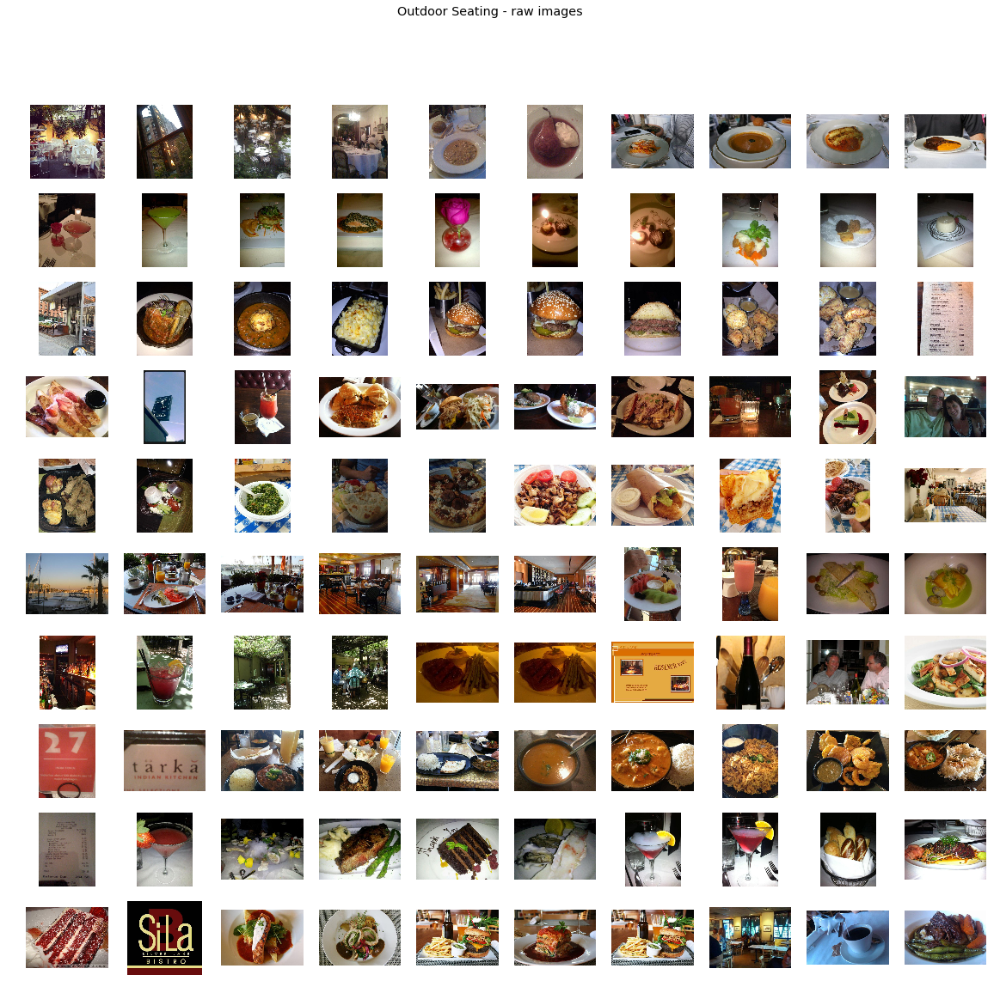

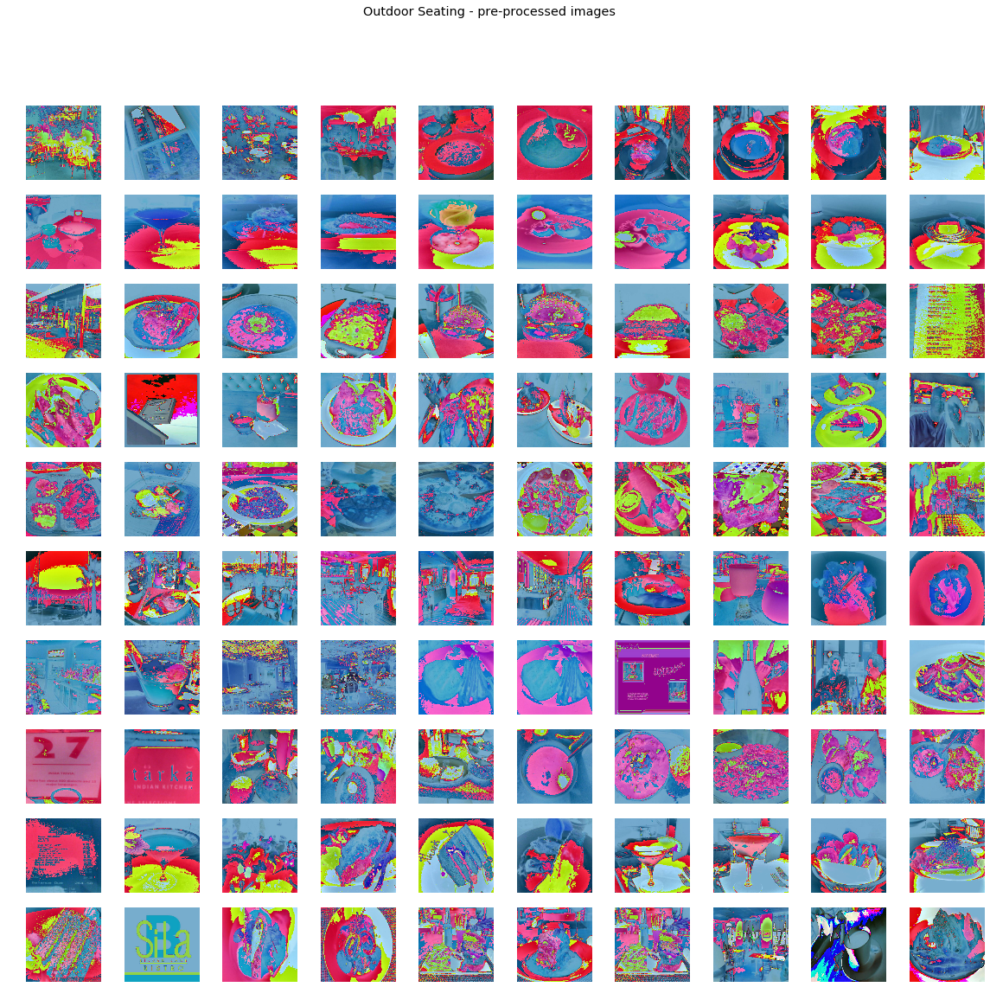

In [71]:
outdoor_seating_places = biz_id_to_attribs[biz_id_to_attribs['outdoor_seating'] == True]['business_id']
max_biz, max_biz_photos = 10, 10
fig = plt.figure(1)
st = fig.suptitle("Outdoor Seating - raw images", fontsize="x-large")
for i, biz_id in enumerate(outdoor_seating_places.to_dict().values()[:max_biz]): # iterate over business with attrib has_alcohol
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)): # iterate over all photos of that particular business 
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=False, preprocess=False))
fig = plt.figure(2)
st = fig.suptitle("Outdoor Seating - pre-processed images", fontsize="x-large")
for i, biz_id in enumerate(outdoor_seating_places.to_dict().values()[:max_biz]):
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)):
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=True, preprocess=True)[0].transpose(1,2,0))

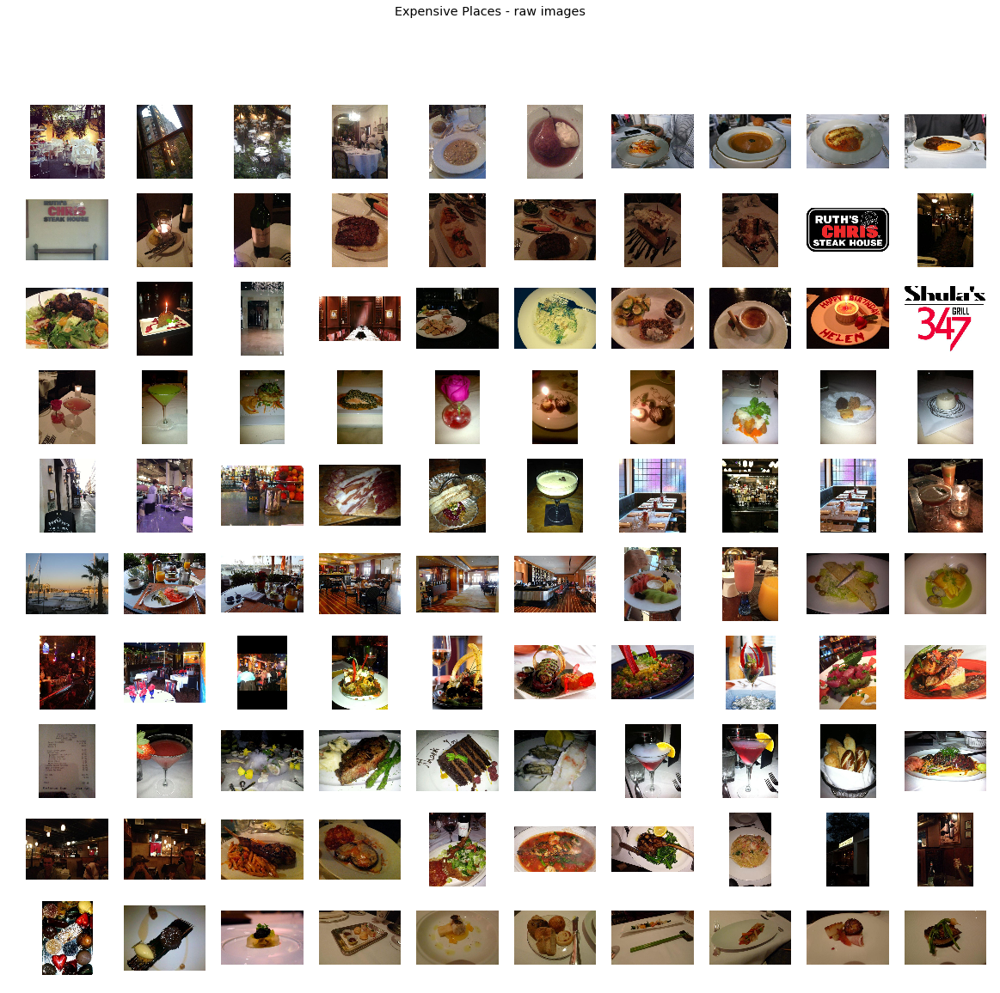

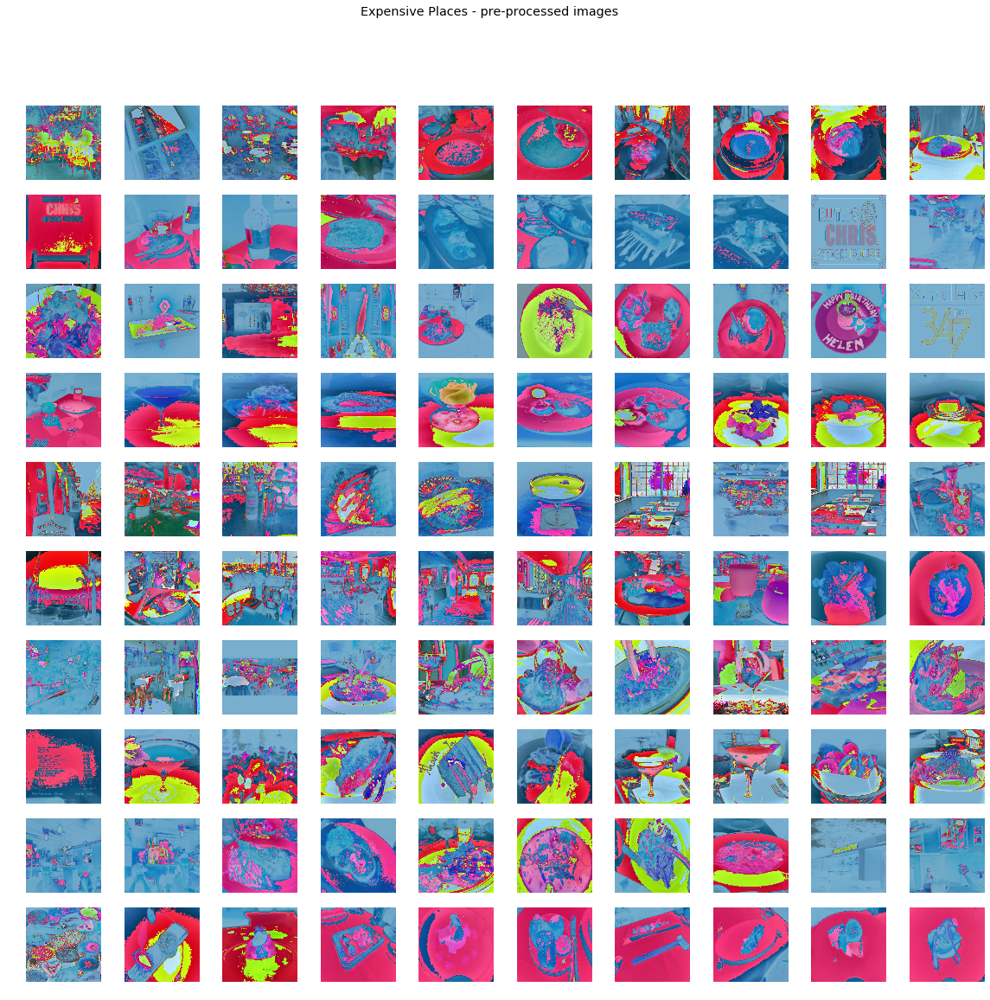

In [82]:
expensive_places = biz_id_to_attribs[biz_id_to_attribs['restaurant_is_expensive'] == True]['business_id']
max_biz, max_biz_photos = 10, 10
fig = plt.figure(1)
st = fig.suptitle("Expensive Places - raw images", fontsize="x-large")
for i, biz_id in enumerate(expensive_places.to_dict().values()[:max_biz]): # iterate over business with attrib has_alcohol
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)): # iterate over all photos of that particular business 
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=False, preprocess=False))
fig = plt.figure(2)
st = fig.suptitle("Expensive Places - pre-processed images", fontsize="x-large")
for i, biz_id in enumerate(expensive_places.to_dict().values()[:max_biz]):
    for j in range(min(len(biz_id_to_photos[biz_id]),max_biz_photos)):
        plt.subplot(max_biz+1,max_biz_photos,i*max_biz_photos+j+1)
        plt.axis("off")
        plt.imshow(readImage(biz_id_to_photos[biz_id][j], vgg_compatible_input=True, preprocess=True)[0].transpose(1,2,0))

## Create training data

In [43]:
num_train, num_test = 16, 16
X_train = np.zeros((num_train, 3, 448, 448))
y_train1 = np.zeros((num_train))
y_train2 = np.zeros((num_train))
X_test = np.zeros((num_test, 3, 448, 448))
y_test1 = np.zeros((num_test))
y_test2 = np.zeros((num_test))
rand_idxs = np.random.randint(0, len(train_photo_to_biz_ids), num_train+num_test)
for idx, photo_biz_id in enumerate(zip(train_photo_to_biz_ids.photo_id[rand_idxs], train_photo_to_biz_ids.business_id[rand_idxs])):
    img_id, biz_id = photo_biz_id
    if idx < num_train:
        X_train[idx,:,:,:] = readImage(img_id, vgg_compatible_input=True, preprocess=True)
        y_train1[idx] = biz_id_to_attribs[biz_id_to_attribs['business_id']==biz_id]['good_for_dinner'].values[0]
        y_train2[idx] = biz_id_to_attribs[biz_id_to_attribs['business_id']==biz_id]['good_for_lunch'].values[0]
    else:
        X_test[idx-num_train,:,:,:] = readImage(img_id, vgg_compatible_input=True, preprocess=True)
        y_test1[idx-num_train] = biz_id_to_attribs[biz_id_to_attribs['business_id']==biz_id]['good_for_dinner'].values[0]
        y_test2[idx-num_train] = biz_id_to_attribs[biz_id_to_attribs['business_id']==biz_id]['good_for_lunch'].values[0]
y_train1_cat = np_utils.to_categorical(y_train1)
y_train2_cat = np_utils.to_categorical(y_train2)
y_test1_cat = np_utils.to_categorical(y_test1)
y_test2_cat = np_utils.to_categorical(y_test2)

In [33]:
def VGG_16(weights_path=None):
    model = Sequential()
    model.add(ZeroPadding2D((1,1),input_shape=(3,224,224)))
    model.add(Convolution2D(64, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(64, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(1000, activation='softmax'))

    if weights_path:
        model.load_weights(weights_path)

    return model

In [34]:
vgg16_model = VGG_16('vgg16_weights.h5')

In [35]:
sgd = SGD(lr=0.1, decay=1e-6, momentum=0.9, nesterov=True)
vgg16_model.compile(optimizer=sgd, loss='categorical_crossentropy')

/Users/yrevar/virtualenvs/keras/lib/python2.7/site-packages/theano/tensor/signal/downsample.py:6: UserWarning: downsample module has been moved to the theano.tensor.signal.pool module.
  "downsample module has been moved to the theano.tensor.signal.pool module.")


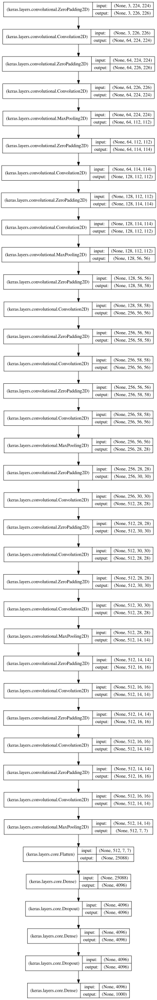

In [13]:
# To display model arch
SVG(to_graph(vgg16_model, show_shape=True).create(prog='dot', format='svg'))

In [19]:
def VGG_16_multilabel(weights_path=None):
    m = Graph()
    
    #64 repr
    m.add_input(name='input', input_shape=(3,224,224))
    m.add_node(ZeroPadding2D((1,1)), name="pad0", input="input")
    m.add_node(Convolution2D(8, 3, 3, activation='relu'), name="conv1", input="pad0")
    m.add_node(ZeroPadding2D((1,1)), name="pad1", input="conv1")
    m.add_node(Convolution2D(8, 3, 3, activation='relu'), name="conv2", input="pad1")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp2", input="conv2")

    #128 repr
    m.add_node(ZeroPadding2D((1,1)), name="pad2", input="maxp2")
    m.add_node(Convolution2D(16, 3, 3, activation='relu'), name="conv3", input="pad2")
    m.add_node(ZeroPadding2D((1,1)), name="pad3", input="conv3")
    m.add_node(Convolution2D(16, 3, 3, activation='relu'), name="conv4", input="pad3")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp4", input="conv4")

    #256 repr
    m.add_node(ZeroPadding2D((1,1)), name="pad4", input="maxp4")
    m.add_node(Convolution2D(32, 3, 3, activation='relu'), name="conv5", input="pad4")
    m.add_node(ZeroPadding2D((1,1)), name="pad5", input="conv5")
    m.add_node(Convolution2D(32, 3, 3, activation='relu'), name="conv6", input="pad5")
    m.add_node(ZeroPadding2D((1,1)), name="pad6", input="conv6")
    m.add_node(Convolution2D(32, 3, 3, activation='relu'), name="conv7", input="pad6")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp7", input="conv7")

    #512 repr
    m.add_node(ZeroPadding2D((1,1)), name="pad7", input="maxp7")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv8", input="pad7")
    m.add_node(ZeroPadding2D((1,1)), name="pad8", input="conv8")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv9", input="pad8")
    m.add_node(ZeroPadding2D((1,1)), name="pad9", input="conv9")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv10", input="pad9")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp10", input="conv10")
    
    #512 repr
    m.add_node(ZeroPadding2D((1,1)), name="pad10", input="maxp10")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv11", input="pad10")
    m.add_node(ZeroPadding2D((1,1)), name="pad11", input="conv11")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv12", input="pad11")
    m.add_node(ZeroPadding2D((1,1)), name="pad12", input="conv12")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv13", input="pad12")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp13", input="conv13")
    
    m.add_node(Flatten(), name="fork", input="maxp13")
    
    m.add_node(Dense(1024, activation='relu'), name="h1fc1", input="fork")
    m.add_node(Dropout(0.5), name="h1fc1_drop", input="h1fc1")
    m.add_node(Dense(512, activation='relu'), name="h1fc2", input="h1fc1_drop")
    m.add_node(Dropout(0.5), name="h1fc2_drop", input="h1fc2")
    m.add_node(Dense(2, activation='softmax'), name="h1out", input="h1fc2_drop")
    
    m.add_node(Dense(1024, activation='relu'), name="h2fc1", input="fork")
    m.add_node(Dropout(0.5), name="h2fc1_drop", input="h2fc1")
    m.add_node(Dense(512, activation='relu'), name="h2fc2", input="h2fc1_drop")
    m.add_node(Dropout(0.5), name="h2fc2_drop", input="h2fc2")
    m.add_node(Dense(2, activation='softmax'), name="h2out", input="h2fc2_drop")
    
    m.add_output(name='output1', input='h1out')
    m.add_output(name='output2', input='h2out')

    if weights_path:
        m.load_weights(weights_path)

    return m

In [205]:
def VGG_16_multilabel_t(weights_path=None):
    m = Graph()
    
    m.add_input(name='input', input_shape=(3,448,448))
    m.add_node(ZeroPadding2D((1,1)), name="pad0", input="input")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv1", input="pad0")
    m.add_node(ZeroPadding2D((1,1)), name="pad1", input="conv1")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv2", input="pad1")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp2", input="conv2")

    m.add_node(ZeroPadding2D((1,1)), name="pad2", input="maxp2")
    m.add_node(Convolution2D(128, 3, 3, activation='relu'), name="conv3", input="pad2")
    m.add_node(ZeroPadding2D((1,1)), name="pad3", input="conv3")
    m.add_node(Convolution2D(128, 3, 3, activation='relu'), name="conv4", input="pad3")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp4", input="conv4")

    m.add_node(Flatten(), name="fork", input="maxp4")
    
    m.add_node(Dense(1024, activation='relu'), name="h1fc1", input="fork")
    m.add_node(Dropout(0.5), name="h1fc1_drop", input="h1fc1")
    m.add_node(Dense(512, activation='relu'), name="h1fc2", input="h1fc1_drop")
    m.add_node(Dropout(0.5), name="h1fc2_drop", input="h1fc2")
    m.add_node(Dense(2, activation='softmax'), name="h1out", input="h1fc2_drop")
    
    m.add_node(Dense(1024, activation='relu'), name="h2fc1", input="fork")
    m.add_node(Dropout(0.5), name="h2fc1_drop", input="h2fc1")
    m.add_node(Dense(512, activation='relu'), name="h2fc2", input="h2fc1_drop")
    m.add_node(Dropout(0.5), name="h2fc2_drop", input="h2fc2")
    m.add_node(Dense(2, activation='softmax'), name="h2out", input="h2fc2_drop")
    
    m.add_output(name='output1', input='h1out')
    m.add_output(name='output2', input='h2out')

    if weights_path:
        m.load_weights(weights_path)

    return m

In [40]:
def VGG_16_fullyconv_multilabel(weights_path=None):
    m = Graph()
    
    m.add_input(name='input', input_shape=(3,448,448))
    m.add_node(ZeroPadding2D((1,1)), name="pad0", input="input")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv1", input="pad0")
    m.add_node(ZeroPadding2D((1,1)), name="pad1", input="conv1")
    m.add_node(Convolution2D(64, 3, 3, activation='relu'), name="conv2", input="pad1")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp2", input="conv2")

    m.add_node(ZeroPadding2D((1,1)), name="pad2", input="maxp2")
    m.add_node(Convolution2D(128, 3, 3, activation='relu'), name="conv3", input="pad2")
    m.add_node(ZeroPadding2D((1,1)), name="pad3", input="conv3")
    m.add_node(Convolution2D(128, 3, 3, activation='relu'), name="conv4", input="pad3")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp4", input="conv4")
    
    m.add_node(ZeroPadding2D((3,3)), name="pad4", input="maxp4")
    m.add_node(Convolution2D(128, 7, 7, activation='relu'), name="conv5", input="pad4")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp5", input="conv5")
    
    m.add_node(ZeroPadding2D((3,3)), name="pad5", input="maxp5")
    m.add_node(Convolution2D(128, 7, 7, activation='relu'), name="conv6", input="pad5")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp6", input="conv6")
    
    m.add_node(ZeroPadding2D((3,3)), name="pad6", input="maxp6")
    m.add_node(Convolution2D(128, 7, 7, activation='relu'), name="conv7", input="pad6")
    m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp7", input="conv7")
    m.add_node(Flatten(), name="fork", input="maxp7")
    
    m.add_node(Dense(256, activation='relu'), name="c1_fc1", input="fork")
    m.add_node(Dropout(0.5), name="c1_fc1_drop", input="c1_fc1")
    m.add_node(Dense(128, activation='relu'), name="c1_fc2", input="c1_fc1_drop")
    m.add_node(Dropout(0.5), name="c1_fc2_drop", input="c1_fc2")
    m.add_node(Dense(2, activation='softmax'), name="c1_prob", input="c1_fc2_drop")
    
    m.add_node(Dense(256, activation='relu'), name="c2_fc1", input="fork")
    m.add_node(Dropout(0.5), name="c2_fc1_drop", input="c2_fc1")
    m.add_node(Dense(128, activation='relu'), name="c2_fc2", input="c2_fc1_drop")
    m.add_node(Dropout(0.5), name="c2_fc2_drop", input="c2_fc2")
    m.add_node(Dense(2, activation='softmax'), name="c2_prob", input="c2_fc2_drop")
    
#     m.add_node(Convolution2D(128, 7, 7, activation='relu'), name="c1_conv_max", input="fork")
#     m.add_node(Convolution2D(64, 1, 1, activation='relu'), name="c1_conv1d_1", input="c1_conv_max") 
#     m.add_node(Convolution2D(2, 1, 1), name="c1_out", input="c1_conv1d_1") 
#     m.add_node(Flatten(), name="c1_out_flat", input="c1_out")
#     m.add_node(Activation('softmax'), name="c1_prob", input="c1_out_flat")
    
#     m.add_node(Convolution2D(128, 7, 7, activation='relu'), name="c2_conv_max", input="fork")
#     m.add_node(Convolution2D(64, 1, 1, activation='relu'), name="c2_conv1d_1", input="c2_conv_max") 
#     m.add_node(Convolution2D(2, 1, 1), name="c2_out", input="c2_conv1d_1")
#     m.add_node(Flatten(), name="c2_out_flat", input="c2_out")
#     m.add_node(Activation('softmax'), name="c2_prob", input="c2_out_flat")

#     m.add_node(ZeroPadding2D((1,1)), name="pad4", input="maxp4")
#     m.add_node(Convolution2D(256, 3, 3, activation='relu'), name="conv5", input="pad4")
#     m.add_node(ZeroPadding2D((1,1)), name="pad5", input="conv5")
#     m.add_node(Convolution2D(256, 3, 3, activation='relu'), name="conv6", input="pad5")
#     m.add_node(ZeroPadding2D((1,1)), name="pad6", input="conv6")
#     m.add_node(Convolution2D(256, 3, 3, activation='relu'), name="conv7", input="pad6")
#     m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp7", input="conv7")

#     m.add_node(ZeroPadding2D((1,1)), name="pad7", input="maxp7")
#     m.add_node(Convolution2D(512, 3, 3, activation='relu'), name="conv8", input="pad7")
#     m.add_node(ZeroPadding2D((1,1)), name="pad8", input="conv8")
#     m.add_node(Convolution2D(512, 3, 3, activation='relu'), name="conv9", input="pad8")
#     m.add_node(ZeroPadding2D((1,1)), name="pad9", input="conv9")
#     m.add_node(Convolution2D(512, 3, 3, activation='relu'), name="conv10", input="pad9")
#     m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp10", input="conv10")
    
#     m.add_node(ZeroPadding2D((1,1)), name="pad10", input="maxp10")
#     m.add_node(Convolution2D(512, 3, 3, activation='relu'), name="conv11", input="pad10")
#     m.add_node(ZeroPadding2D((1,1)), name="pad11", input="conv11")
#     m.add_node(Convolution2D(512, 3, 3, activation='relu'), name="conv12", input="pad11")
#     m.add_node(ZeroPadding2D((1,1)), name="pad12", input="conv12")
#     m.add_node(Convolution2D(512, 3, 3, activation='relu'), name="conv13", input="pad12")
#     m.add_node(MaxPooling2D((2,2), strides=(2,2)), name="maxp13", input="conv13")
    
#     m.add_node(Flatten(), name="fork", input="maxp7")
    
#     m.add_node(Dense(2048, activation='relu'), name="h1fc1", input="fork")
#     m.add_node(Dropout(0.5), name="h1fc1_drop", input="h1fc1")
#     m.add_node(Dense(1024, activation='relu'), name="h1fc2", input="h1fc1_drop")
#     m.add_node(Dropout(0.5), name="h1fc2_drop", input="h1fc2")
#     m.add_node(Dense(7, activation='softmax'), name="h1out", input="h1fc2_drop")
    
#     m.add_node(Dense(2048, activation='relu'), name="h2fc1", input="fork")
#     m.add_node(Dropout(0.5), name="h2fc1_drop", input="h2fc1")
#     m.add_node(Dense(1024, activation='relu'), name="h2fc2", input="h2fc1_drop")
#     m.add_node(Dropout(0.5), name="h2fc2_drop", input="h2fc2")
#     m.add_node(Dense(7, activation='softmax'), name="h2out", input="h2fc2_drop")
    
#     m.add_node(Dense(2048, activation='relu'), name="h3fc1", input="fork")
#     m.add_node(Dropout(0.5), name="h3fc1_drop", input="h3fc1")
#     m.add_node(Dense(1024, activation='relu'), name="h3fc2", input="h3fc1_drop")
#     m.add_node(Dropout(0.5), name="h3fc2_drop", input="h3fc2")
#     m.add_node(Dense(7, activation='softmax'), name="h3out", input="h3fc2_drop")
    
#     m.add_node(Dense(2048, activation='relu'), name="h4fc1", input="fork")
#     m.add_node(Dropout(0.5), name="h4fc1_drop", input="h4fc1")
#     m.add_node(Dense(1024, activation='relu'), name="h4fc2", input="h4fc1_drop")
#     m.add_node(Dropout(0.5), name="h4fc2_drop", input="h4fc2")
#     m.add_node(Dense(7, activation='softmax'), name="h4out", input="h4fc2_drop")
    
#     m.add_node(Dense(2048, activation='relu'), name="h5fc1", input="fork")
#     m.add_node(Dropout(0.5), name="h5fc1_drop", input="h5fc1")
#     m.add_node(Dense(1024, activation='relu'), name="h5fc2", input="h5fc1_drop")
#     m.add_node(Dropout(0.5), name="h5fc2_drop", input="h5fc2")
#     m.add_node(Dense(7, activation='softmax'), name="h5out", input="h5fc2_drop")
    
#     m.add_node(Dense(2048, activation='relu'), name="h6fc1", input="fork")
#     m.add_node(Dropout(0.5), name="h6fc1_drop", input="h6fc1")
#     m.add_node(Dense(1024, activation='relu'), name="h6fc2", input="h6fc1_drop")
#     m.add_node(Dropout(0.5), name="h6fc2_drop", input="h6fc2")
#     m.add_node(Dense(7, activation='softmax'), name="h6out", input="h6fc2_drop")
    
#     m.add_node(Dense(2048, activation='relu'), name="h7fc1", input="fork")
#     m.add_node(Dropout(0.5), name="h7fc1_drop", input="h7fc1")
#     m.add_node(Dense(1024, activation='relu'), name="h7fc2", input="h7fc1_drop")
#     m.add_node(Dropout(0.5), name="h7fc2_drop", input="h7fc2")
#     m.add_node(Dense(7, activation='softmax'), name="h7out", input="h7fc2_drop")
    
    m.add_output(name='output1', input='c1_prob')
    m.add_output(name='output2', input='c2_prob')
    
    if weights_path:
        m.load_weights(weights_path)

    return m

In [41]:
yelp_model = VGG_16_fullyconv_multilabel() #"./vgg16_fc_ml_weights.h5")
# yelp_model = VGG_16_multilabel_t()

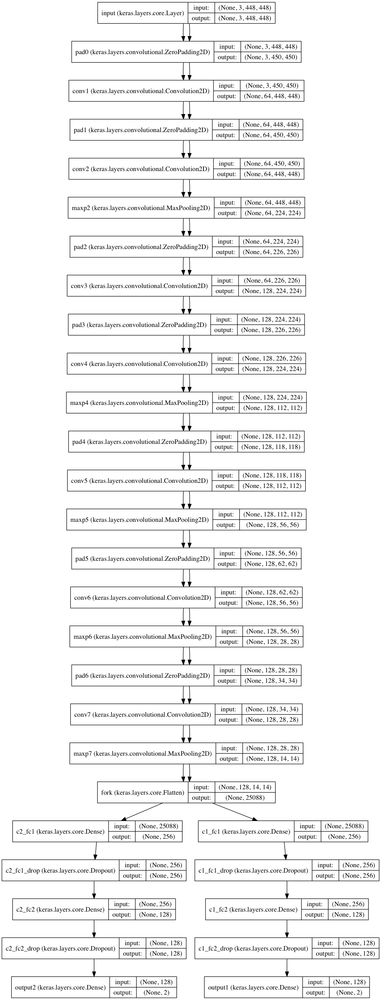

In [42]:
# display graph
plot(yelp_model, to_file='graph.png', show_shape=True)
IPython.display.Image('./graph.png')

In [49]:
# transfer learning
conv_idx = 0
for i in range(9):
    if "conv" in vgg16_model.layers[i].name:
        conv_idx += 1
        conv_layer_name = "conv" + str(conv_idx)
        if conv_layer_name in yelp_model.namespace:
            print "Transfer vgg brain layer", i, "to conv", conv_idx
            yelp_model.nodes[conv_layer_name].W.set_value(vgg16_model.layers[i].get_weights()[0]);
            yelp_model.nodes[conv_layer_name].b.set_value(vgg16_model.layers[i].get_weights()[1]);
#             if conv_idx <= freeze_end:
#                 yelp_model.nodes[conv_layer_name].trainable = False

Transfer vgg brain layer 1 to conv 1
Transfer vgg brain layer 3 to conv 2
Transfer vgg brain layer 6 to conv 3
Transfer vgg brain layer 8 to conv 4


In [50]:
# freeze bottom layers
for node_name in yelp_model.nodes.keys():
    yelp_model.nodes[node_name].trainable = False
    if node_name == "conv4":
        break

In [55]:
sgd = SGD(lr=0.0005, decay=0.0, momentum=0.9, nesterov=True)
yelp_model.compile(optimizer=sgd, loss={'output1':'categorical_crossentropy', 'output2':'categorical_crossentropy'})

In [56]:
history = yelp_model.fit( \
            {'input':X_train, 'output1':y_train1_cat, 'output2':y_train2_cat}, \
            batch_size=4, verbose=1, nb_epoch=5, validation_split=0.25)

Train on 12 samples, validate on 4 samples
Epoch 1/5
12/12 [==============================] - 331s - loss: 13.4317 - val_loss: 12.0886
Epoch 2/5
12/12 [==============================] - 338s - loss: 14.7749 - val_loss: 12.0886
Epoch 3/5
12/12 [==============================] - 354s - loss: 12.0886 - val_loss: 12.0886
Epoch 4/5
12/12 [==============================] - 353s - loss: 16.1181 - val_loss: 12.0886
Epoch 5/5
12/12 [==============================] - 347s - loss: 14.7749 - val_loss: 12.0886


In [152]:
# w1 = yelp_model.nodes['conv7'].W
# # w1 = vgg16_model.layers[15].W
# w1.get_value().shape
# # N C H W 

# num_repr = len(w1.get_value())

# for i, w in enumerate(w1.get_value()):
#     plt.subplot(np.sqrt(num_repr)+1, np.sqrt(num_repr), i+1)
# #     plt.imshow(w1.get_value()[i].transpose(1,2,0))
#     plt.imshow(w1.get_value()[i].transpose(1,2,0)[:,:,0], cmap="gray", interpolation='none')

In [147]:
predictions = yelp_model.predict({'input': X_test}, batch_size=8)

In [54]:
y_test1_cat = np_utils.to_categorical(y_test1)
y_test2_cat = np_utils.to_categorical(y_test2)

In [55]:
np.mean(y_test1 == np_utils.categorical_probas_to_classes(predictions['output1']))

0.6875

In [56]:
np.mean(y_test2 == np_utils.categorical_probas_to_classes(predictions['output2']))

0.8125

In [199]:
# img = misc.imread(os.path.join('../input','train_photos', str(biz_id_to_photos[1000][0])+".jpg")) 
img = cv2.resize(readImage(biz_id_to_photos[1000][0], vgg_compatible_input=False, preprocess=True), (1600, 1600))